<a href="https://colab.research.google.com/github/Jucicarla/Introducao-Machine-Learning/blob/main/Aula1_Conceito_Processamento%20Digital_Imagem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Disciplina de Introdução ao Aprendizado de Máquina

# Aula 1 - Conceitos de PDI

O processamento digital de imagens é uma etapa importante a ser realizada, para que os modelos de aprendizagem de máquina recebam entradas sem ruído excessivo, e com isso, possibilitando melhores resultados na tarefa a ser realizada.

Antes de entrarmos nos conceitos e aplicações de aprendizado de máquina, vamos praticar algumas das principais funcionalidades dos módulos do python que tornam possível a manipulação de arquivos de imagens.


In [1]:
!pip install opencv -python


Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

no such option: -p



Pil

Vamos iniciar utilizando o PIL - Python Image Library para algumas operações com imagens.

Esta biblioteca possui diversas funcionalidades, tais como: redimensionamento, recorte, rotação, conversão de cores e muitas outras.

O módulo ImageOps contém diversas operações pré-definidas de processamento


In [109]:
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from pylab import *
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
%matplotlib inline

In [110]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [107]:
#Versão do CV2
cv2.__version__

'4.1.2'

In [3]:
pwd

'/content'

In [7]:
im_nova = array(Image.open('/content/drive/MyDrive/3) Introdução a ML/imagens_am/arara.jpg'))

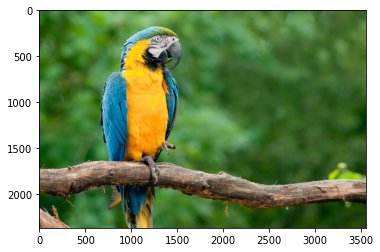

In [8]:
imshow(im_nova)


Subplots

Muitas vezes é mais produtivo realizarmos comparações de várias figuras em uma única célula do jupyter. Para isso, vamos utilizar o subplot() do matplotlib.

Os argumentos são: (num_linhas, num_colunas, sequência do que será mostrado).

Normalmente precisamos utilizar o método figure() para realizar algumas configurações, como o tamanho da figura.

Para visualizar várias imagens em uma única célula, utilizamos o subplot do matplotlib.

Os argumentos são: (num_linhas, num_colunas, sequência do que será mostrado).


Text(0.5, 1.0, 'Cópia')

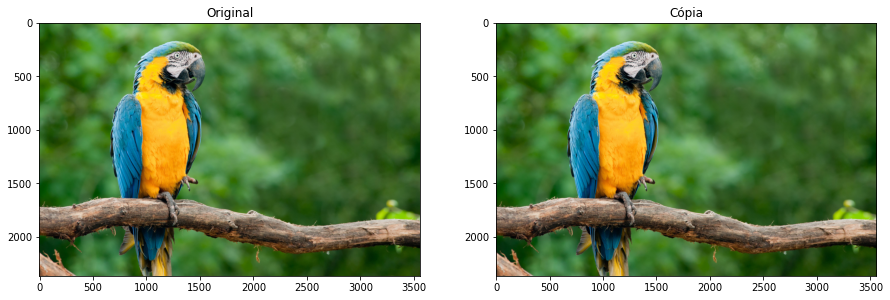

In [16]:
fig_comp1 = figure(figsize=(15,15))
subplot(1, 2, 1)
plt.title("Original")
plt.imshow(im_nova)
subplot(1, 2, 2)
plt.imshow(im_nova)
plt.title("Cópia")




**Exercício - Criação de função de plotagem**

    
*   Crie uma função que receba: imagem1 e seu título, imagem2 e seu título, e o tamanho a ser utilizado para mostrar as duas imagens. Passaremos a utilizar bastante essa função, sempre que houver necessidade de comparar imagems.






**Resolução do exercício (plotagem) - Função para plotagem de 2 imagens lado a lado:**

def plot_imagens_2(img1, tit1, img2, tit2, tamanho_fig):

In [9]:
def plot_imagens_2(img1, tit1, img2, tit2, tamanho_fig):
    figure(figsize = tamanho_fig)
    plt.subplot(1, 2, 1), plt.imshow(img1), plt.title(tit1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 2, 2), plt.imshow(img2), plt.title(tit2)                 
    plt.xticks([]), plt.yticks([])
    plt.show()

In [ ]:
def plot_imagens_3(img1, tit1, img2, tit2, img3, tit3, tamanho_fig):
    figure(figsize = tamanho_fig)
    plt.subplot(1, 3, 1), plt.imshow(img1), plt.title(tit1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 2), plt.imshow(img2), plt.title(tit2)                 
    plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 3), plt.imshow(img3), plt.title(tit3)                 
    plt.xticks([]), plt.yticks([])
    plt.show()

In [48]:
def plot_imagens_2(img1, tit1, img2, tit2, tamanho_fig, ticks = False):
    figure(figsize = tamanho_fig)
    plt.subplot(1, 2, 1), plt.imshow(img1), plt.title(tit1)
    if not ticks:
        plt.xticks([]), plt.yticks([])
    plt.subplot(1, 2, 2), plt.imshow(img2), plt.title(tit2)                 
    if not ticks:
        plt.xticks([]), plt.yticks([])
    plt.show()
    
    
def plot_imagens_3(img1, tit1, img2, tit2, img3, tit3, tamanho_fig, ticks = False):
    figure(figsize = tamanho_fig)
    plt.subplot(1, 3, 1), plt.imshow(img1), plt.title(tit1)
    if not ticks:
        plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 2), plt.imshow(img2), plt.title(tit2)                 
    if not ticks:
        plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 3), plt.imshow(img3), plt.title(tit3)                 
    if not ticks:
        plt.xticks([]), plt.yticks([])
    plt.show()


Conceitos básicos sobre imagens e manipulação de arquivos de imagens

Uma imagem pode ser entendida como um array 2D, criado a partir de valores de pixels.

Uma imagem pode também ser chamado de frame ou quadro.

Um vídeo é um conjunto de frames subsequentes, ou seja, consideramos o componente tempo e uma ordem de geração e reprodução, para que a cena seja compreendida. Um frame é, portanto, uma imagem individual em uma sequência de vídeos.

Em uma imagem colorida, cada pixel pode ter valores entre 8 e 32 bits de largura.

Imagens monocromáticas (em sua maioria) utilizam 8 bits para cada pixel.

In [10]:
im_nova.shape

(2367, 3557, 3)

**Técnicas de manipulação de imagens:**

   * Interpolação: normalmente é empregada para ampliar imagens, a partir da geração de pixels desconhecidos através da informação de pixels conhecidos.

   * Uma das técnicas utilizadas é dos vizinhos mais próximos, que repete o valor do pixel do vizinho mais próximo. Produz resultados mais grosseiros, com efeito "serrilhado".

*Melhorias de imagens*

Algumas técnicas utilizadas para realizar ajustes ou melhorias em imagens são:

  * Operações aritméticas: são feixas pixel a pixel, e podem ser utilizadas para operações detalhadas em imagens. Exemplos:
        * Adição: atenuar valores de médias nulas e descorrelatas.
        * Subtração: pode mostrar ou realçar a diferenças entre imagens.

  * Filtragem espacial e frequencial: utilizam técnicas como a convolução e mudança de domínio para realizar ajustes em imagens.

  * Transformações radiométricas: são aplicadas diretamente no nível de cinza das imagens monocromáticas, independente da posição dos pixels visitados e os dos pixels vizinhos.

  * Manipulação de histogramas: retratam e modificam como os pixels estão distribuídos dinamicamente na imagem. É possível realizar melhorias através de histogramas que consideram aspectos globais (envolvendo a imagem completa) ou locais (usando blocos da imagem).

  * Filtragem homomórfica: operação não linear atua na diminuição da parcela de iluminação e ressalta a contribuição da refletância, gerando imagens com aspecto mais uniforme de iluminação.



In [11]:
type(im_nova)

numpy.ndarray

In [12]:
im_nova

array([[[ 57, 124,  53],
        [ 56, 123,  52],
        [ 55, 122,  51],
        ...,
        [ 62, 100,  41],
        [ 62, 100,  41],
        [ 62, 100,  41]],

       [[ 59, 126,  55],
        [ 58, 125,  54],
        [ 57, 124,  53],
        ...,
        [ 62, 100,  41],
        [ 61,  99,  40],
        [ 61,  99,  40]],

       [[ 59, 126,  55],
        [ 59, 126,  55],
        [ 58, 125,  54],
        ...,
        [ 62, 100,  41],
        [ 62, 100,  41],
        [ 61,  99,  40]],

       ...,

       [[ 78,  47,  18],
        [ 80,  49,  20],
        [ 84,  53,  24],
        ...,
        [ 40,  68,  10],
        [ 37,  65,   7],
        [ 36,  64,   6]],

       [[ 80,  46,  18],
        [ 83,  49,  21],
        [ 88,  54,  26],
        ...,
        [ 39,  67,   9],
        [ 37,  65,   7],
        [ 36,  64,   6]],

       [[ 79,  45,  17],
        [ 84,  50,  22],
        [ 90,  56,  28],
        ...,
        [ 38,  66,   8],
        [ 36,  64,   6],
        [ 35,  63,   5]]

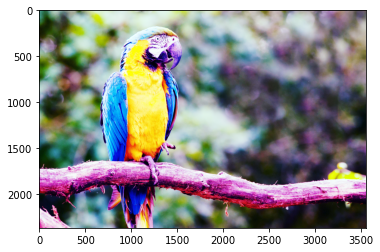

In [17]:
img_p = Image.fromarray(np.uint8(im_nova))
img_p = ImageOps.equalize(img_p)
plt.imshow(img_p)

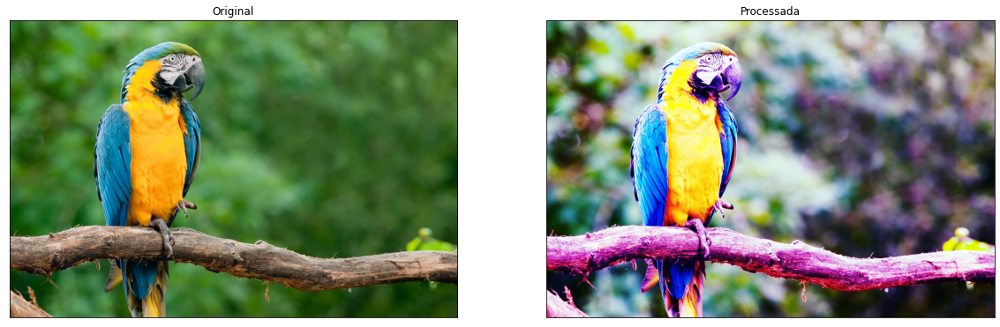

In [18]:
plot_imagens_2(im_nova, "Original", img_p, "Processada", (20,20))

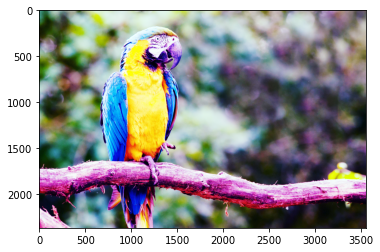

In [19]:
img2 = np.asarray(img_p)
plt.imshow(img2)



Um histograma é uma função h(l) resultante de uma operação global, onde para cada nível de cinza l é atribuído um valor correspondente e a frequência de ocorrência daquele nível de cinza na imagem.

Retrata, de forma global, a dinâmica de distribuição dos pixels na imagem.

Pode ser usado na aplicação de melhoria de qualidade e segmentação.

A Equalização de Histograma é uma técnica (como transformação radiométrica) que modifique os valores, e pode ser feita nas seguintes formas:

   * Tornando todos os valores aproximados do caso uniforme: este método não é o melhor para todos os casos, devido às possíveis variações de intensidade de luz em partes diferentes da imagem.

   * Equalização Local do histograma: onde uma janela percorre a imagem, e em cada bloco percorrido, é feita uma equalização do histograma daquela área. Pode gerar problema de amplificação de ruído, e para evitar isso, é importante limitar o contraste.



**O método ravel transforma um array multi-dimensional em uma estrutura flat, de uma dimensão.**

In [20]:
im_nova.shape

(2367, 3557, 3)

Vamos visualizar e avaliar histogramas de images com valores distintos de pixels, imagens mais escuras e mais claras, para entender como o histograma se comporta.

Utilizaremos a função ravel() no NumPy, que transforma a imagem em uma única dimensão (1D) com todos os elementos.


In [ ]:
#distribuição de pixels
im_nova.ravel()

array([ 57, 124,  53, ...,  35,  63,   5], dtype=uint8)

In [15]:
im_nova.ravel().shape

(25258257,)

In [21]:
2367*3557*3

25258257

(array([2484428., 4790706., 5747121., 4418231., 3176054., 1857997.,
        1249233.,  731730.,  372350.,  430407.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

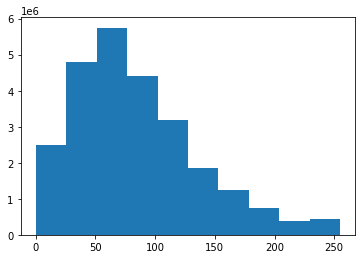

In [ ]:
#os pixels estão tendendo a mais escuro na imagem
plt.hist(im_nova.ravel())

In [ ]:
type(img_p)

PIL.Image.Image

In [ ]:
#converter a imagem em array
img_p = array(img_p)

In [ ]:
img_p.ravel().shape

(25258257,)

In [ ]:
img_p.ravel()

array([ 90, 161, 149, ...,  31,  20,  15], dtype=uint8)

(array([2564733., 2511337., 2596333., 2513658., 2483244., 2465634.,
        2531361., 2405976., 2528710., 2657271.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

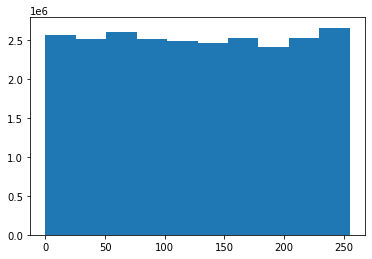

In [ ]:
#criou um gráfico bem equilibrado de cor
plt.hist(img_p.ravel())

In [26]:
im_nova2 = array(Image.open('/content/drive/MyDrive/3) Introdução a ML/imagens_am/taj_mahal_ruido.jpg'))

In [27]:
im_nova2

array([[[102, 135, 178],
        [ 96, 125, 167],
        [125, 147, 194],
        ...,
        [114, 128, 191],
        [ 99, 108, 173],
        [127, 135, 198]],

       [[108, 136, 184],
        [125, 148, 198],
        [ 97, 117, 168],
        ...,
        [113, 135, 192],
        [113, 134, 191],
        [131, 152, 209]],

       [[104, 124, 183],
        [127, 146, 204],
        [133, 150, 206],
        ...,
        [ 86, 122, 170],
        [ 90, 127, 172],
        [135, 172, 217]],

       ...,

       [[  0,   7,   0],
        [  7,  14,   6],
        [ 14,  19,  12],
        ...,
        [ 40,  49,  18],
        [ 54,  61,  28],
        [ 32,  39,   6]],

       [[  9,  17,   2],
        [ 26,  34,  19],
        [ 31,  39,  24],
        ...,
        [ 35,  41,  15],
        [ 51,  57,  31],
        [ 29,  33,   6]],

       [[ 21,  33,  11],
        [ 45,  57,  35],
        [ 51,  60,  41],
        ...,
        [ 58,  63,  40],
        [ 82,  86,  63],
        [ 62,  66,  41]]

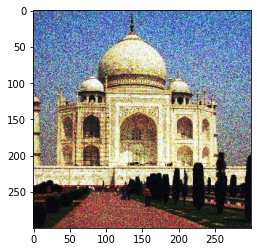

In [28]:
img_p2 = Image.fromarray(np.uint8(im_nova2))
img_p2 = ImageOps.equalize(img_p2)
plt.imshow(img_p2)

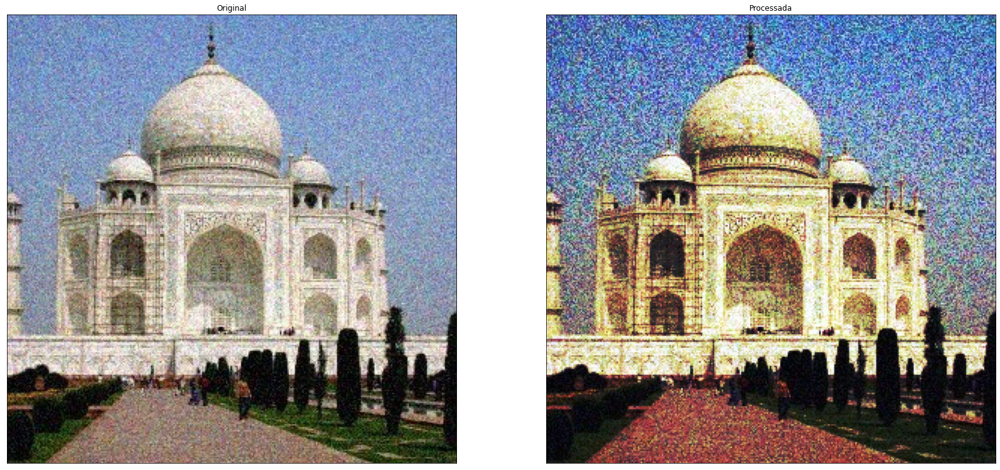

In [29]:
plot_imagens_2(im_nova2, "Original", img_p2, "Processada", (28,28))

(array([22174., 10581.,  9247., 14724., 35839., 49431., 45553., 39826.,
        31081., 11544.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 10 Patch objects>)

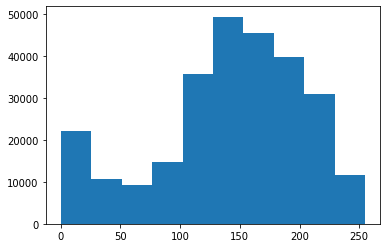

In [30]:
plt.hist(im_nova2.ravel())

In [31]:
#converter a imagem em array
img_p2 = array(img_p2)

(array([27116., 26549., 27698., 26613., 27893., 26373., 26952., 26089.,
        27001., 27716.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 10 Patch objects>)

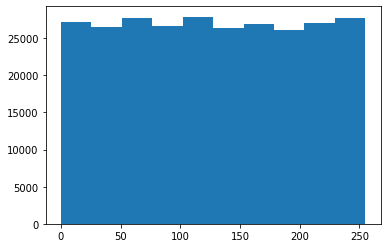

In [32]:
#imagem com muito ruído tendendo para a direita
plt.hist(img_p2.ravel())

Uma das opções de salvamento dos arquivos é utilizar o numpy. O formato padrão tem extensão .npy, e é um formato mais otimizado para armazenamento de arquivos para serem lidos em modelos de aprendizado de máquina, ou simplesmente para processamneto posterior.

In [37]:
np.save("teste1", img_p2) #formato do arquivo de saída é .npy

In [38]:
img3 = np.load("teste1.npy")

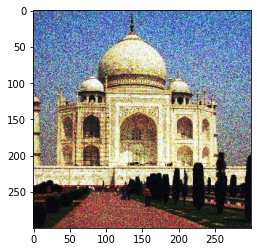

In [39]:
plt.imshow(img3)

Vamos fazer algumas operações de inversão e de visualização dos canais individuais da imagem,

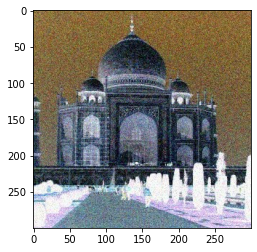

In [40]:
plt.imshow(np.invert(im_nova2))

(array([2484428., 4790706., 5747121., 4418231., 3176054., 1857997.,
        1249233.,  731730.,  372350.,  430407.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

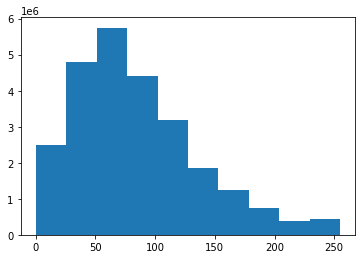

In [ ]:
plt.hist(im_nova.ravel())

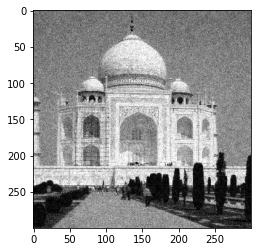

In [41]:
#fatiamento da imagem, usando escala de cinza
plt.imshow(im_nova2[:,:,0], cmap='gray')

In [42]:
ch_r = im_nova[:,:,0]

In [43]:
ch_g = im_nova[:,:,1]

In [44]:
ch_b = im_nova[:,:,2]

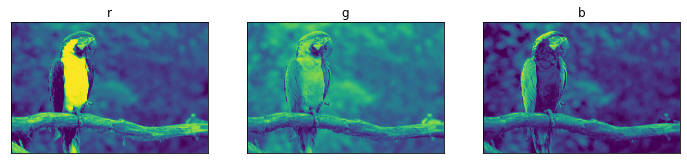

In [49]:
#ch_r = plt.imshow(im_nova[:,:,:])
plot_imagens_3(ch_r, "r", ch_g,"g", ch_b, "b", (12,12))

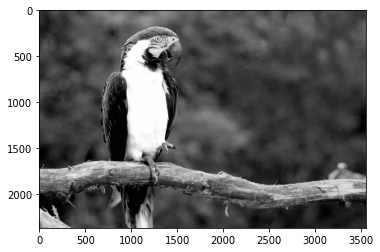

In [52]:
ch_r = plt.imshow(im_nova[:,:,0], cmap='gray')

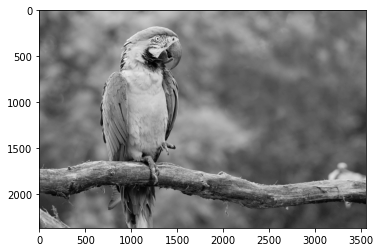

In [53]:
plt.imshow(im_nova[:,:,1], cmap='gray')

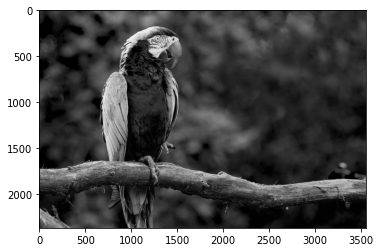

In [54]:
plt.imshow(im_nova[:,:,2], cmap='gray')

In [55]:
img_R = im_nova.copy()

In [57]:
#canal vermelho, zerou os outros canais
img_R[:, :, [1,2]] = 0

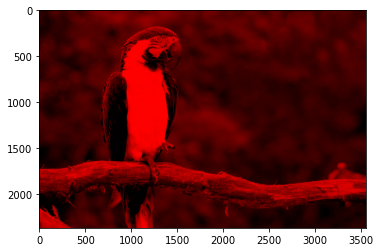

In [58]:
plt.imshow(img_R)

In [59]:
img_G = im_nova.copy()

In [60]:
img_G[:, :, [0,2]]=0

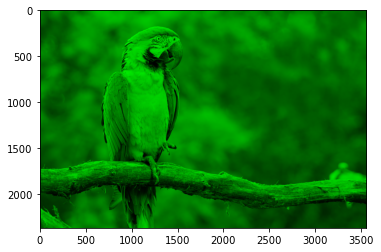

In [ ]:
plt.imshow(img_G)

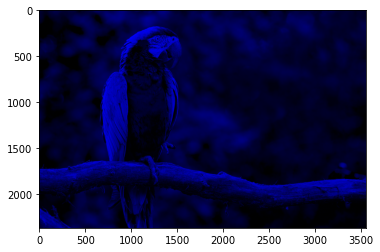

In [61]:
img_B = im_nova.copy()
img_B[:, :, [0,1]]=0
plt.imshow(img_B)


OpenCV

A biblioteca OpenCV contém várias funcionalidades para aplicações com imagem e vídeo. Foi desenvolvida pela Intel a partir de 1999, e liberada com licença BSD, livre tanto para a área acadêmica quanto comercial, e está disponível para as linguagens C, C++ e Python. É suportada nas plataformas Windows, Linux, Android e IOS.

Entre as suas diversas funcionalidades, podemos relacionar como as mais importantes:

    Processamento de imagem.
    Transformações.
    Ajustes e detecções.
    Fluxo óptico.
    Segmentação.
    Calibração de câmera.
    Estimativa de pose.
    Detecção e extração de características.
    Mapas de profundidade.
    Detecção de objetos.



In [67]:
#Open CV
im_1 = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/onca2.jpg")

**Leitura de arquivos de imagens com o OpenCV:**

Para realizar a leitura, basta utilizar a função cv2.imread. É possível ainda indicar um flag para configurar o tipo de imagem que será armazenado:

    cv2.IMREAD_COLOR : imagem colorida. É o padrão. Pode também ser indicado com o valor 1.
    cv2.IMREAD_GRAYSCALE : lê o arquivo de imagem em tons de cinza. Pode ser indicado com o valor 0.
    cv2.IMREAD_UNCHANGED : inclui o canal alpha, que corresponde a um quarto canal, normalmente utilizado para armazenar um overlay (transparência) em arquivos de imagem .png. Pode ser indicado com valor -1.


In [68]:
im_2 = array(Image.open("/content/drive/MyDrive/3) Introdução a ML/imagens_am/onca2.jpg"))

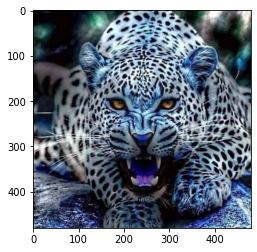

In [69]:
plt.imshow(im_1)

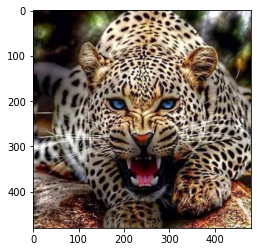

In [70]:
plt.imshow(im_2)

Vamos plotar as duas imagens lidas, pelo OpenCV e pelo Pyplot para iniciar uma análise em relação aos formatos:

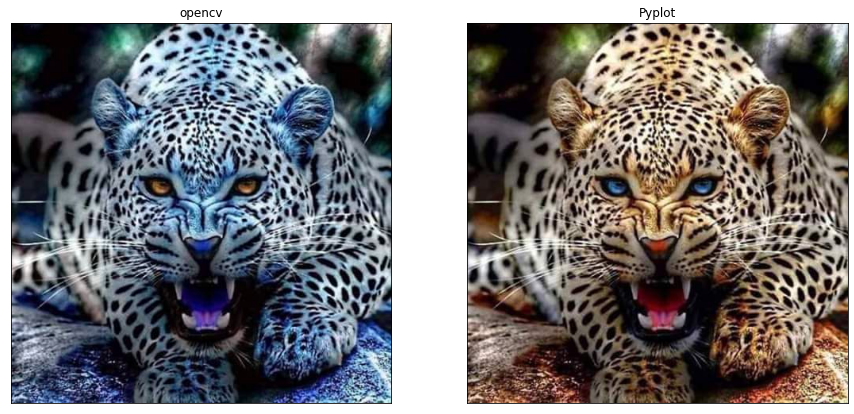

In [71]:
plot_imagens_2(im_1, "opencv", im_2, "Pyplot", (15,15))



No exemplo acima podemos verificar que há um problema nas cores da imagem do opencv.

A diferença é causada pela forma com que o OpenCV lê imagens coloridas, com os canais na ordem BGR (azul, verde, vermelho), enquanto que o Pyplot realiza a leitura na ordem natural / padronizada dos canais (RGB).

Para equalizar a situação, podemos aplicar dois métodos distintos:

Método 1 - Utilização da função cv2.cvtColor():


In [73]:
im_3 = cv2.cvtColor(im_1, cv2.COLOR_BGR2RGB)

In [74]:
im_3.shape

(480, 480, 3)

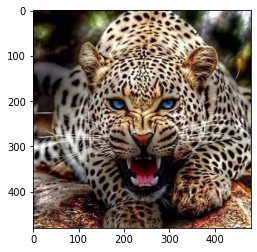

In [75]:
plt.imshow(im_3)



Método 2 - Realizando o fatiamento:

Nesse caso, como são 3 dimensões na imagem, podemos inverter de BGR para RGB lendo do fim para o início dos dados:


In [76]:
im_4 = im_1[:,:,[1,1]]

In [77]:
im_4.shape

(480, 480, 2)


Fatiamento em imagens

Assim como invertemos os canais da imagem, também podemos fatiar a própria imagem, conforme os exemplos que seguem:

Recortando somente a área onde está o sol:


In [83]:
#Fatiamento
#[linha:linha, coluna:coluna]
im_5 = im_2[300:400,200:285]

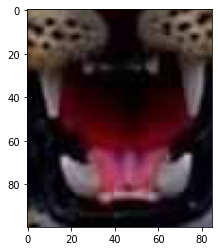

In [85]:
plt.imshow(im_5)


Salvando arquivos de imagem.

Para gerar um novo arquivo a partir da imagem, basta usar o método imwrite(), passando como argumentos o caminho e nome e o objeto.


In [86]:
cv2.imwrite("/content/drive/MyDrive/3) Introdução a ML/imagens_am/boca_onca.jpg", im_5)

True

In [88]:
im_tuc = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/tucano3.png")

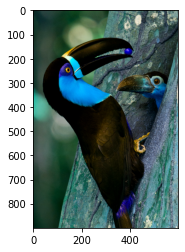

In [89]:
plt.imshow(im_tuc)

In [90]:
im_tuc = cv2.cvtColor(im_tuc, cv2.COLOR_BGR2RGB)

In [91]:
tuc_azul, tuc_verde, tuc_vermelho = cv2.split(im_tuc)

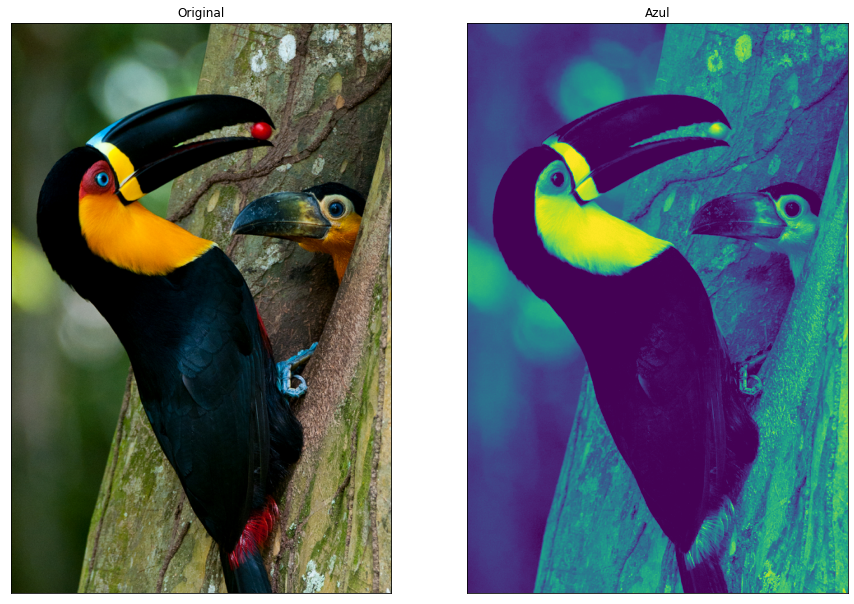

In [92]:
plot_imagens_2(im_tuc,"Original", tuc_azul,"Azul",(15,15))

In [93]:
im_tuc_hsv = cv2.cvtColor(im_tuc, cv2.COLOR_BGR2HSV)

In [94]:
ch_hue, ch_sat, ch_value = cv2.split(im_tuc_hsv)

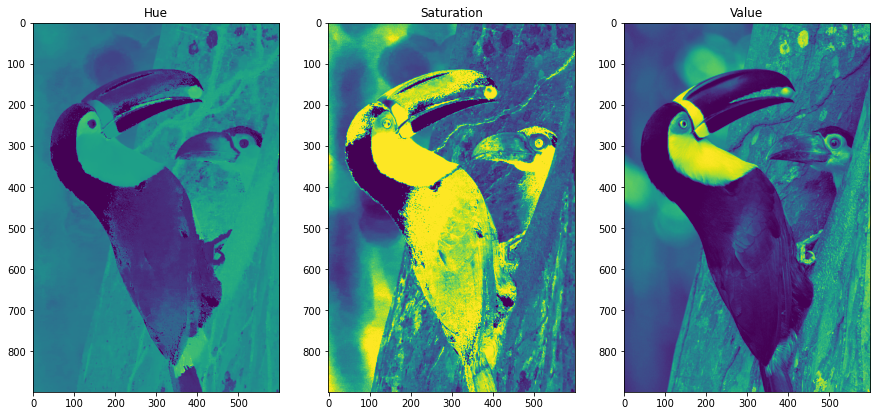

In [95]:
plot_imagens_3(ch_hue, "Hue", ch_sat, "Saturation", ch_value, "Value", (15,15), True)

In [ ]:
#plot.imshow(im_tuc_hsv)

In [117]:

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/arara2.jpg")

# Conversão do espaço de cores - BGR para HSV
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

limiar_claro = np.array([130, 50, 0])
limiar_escuro = np.array([179, 255, 255])

# Limiar da imagem HSV para detectar somente a cor configurada pelos limiares
mask = cv2.inRange(hsv, limiar_claro, limiar_escuro)

# Usar o método Bitwise-AND e mask para mostrar imagem original e máscara do que foi detectado
output = cv2.bitwise_and(image, image, mask=mask)
    
#cv2.imshow("Cor detectada", np.hstack((image,output)))
cv2.waitKey(0)
cv2.destroyAllWindows()

In [125]:
im_red = cv2.resize(im_tuc, None, fx = .25, fy = .25, \
                   interpolation = cv2.INTER_CUBIC)

In [126]:
im_red.shape

(225, 150, 3)

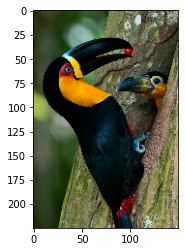

In [127]:
imshow(im_red)

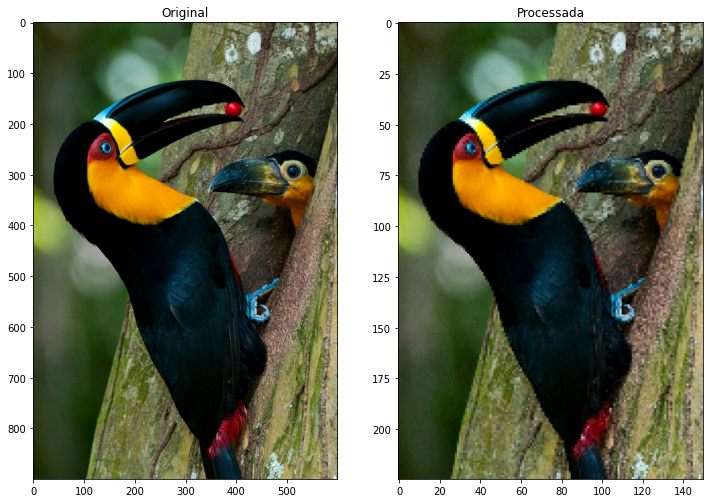

In [128]:
plot_imagens_2(im_tuc, "Original", im_red, "Processada", (12,12), True)

In [130]:
im_pet2 = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/beija-flor3.jpg")
im2 = cv2.cvtColor(im_pet2, cv2.COLOR_BGR2RGB)

In [131]:
shape(im2)

(464, 480, 3)

In [132]:
im2_rz = cv2.resize(im2,(600, 900))

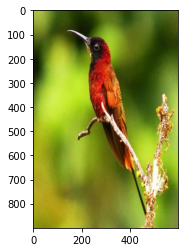

In [133]:
imshow(im2_rz)

In [134]:
#juntando as duas imagens
im3 = im_tuc + im2_rz

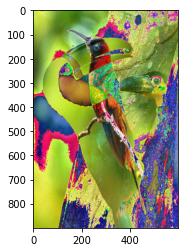

In [135]:
imshow(im3)

In [136]:
im4 = im_tuc - im2_rz

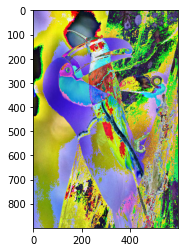

In [137]:
imshow(im4)

Usando as técnicas mostradas até agora, relize as operações abaixo:

a: No arquivo "familia_semluz", faça alguma operação que torne possivel mostrar todos da família.


In [139]:
im_fam = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/familia_semluz.tif")

In [140]:
im_fam.shape

(768, 1024, 3)

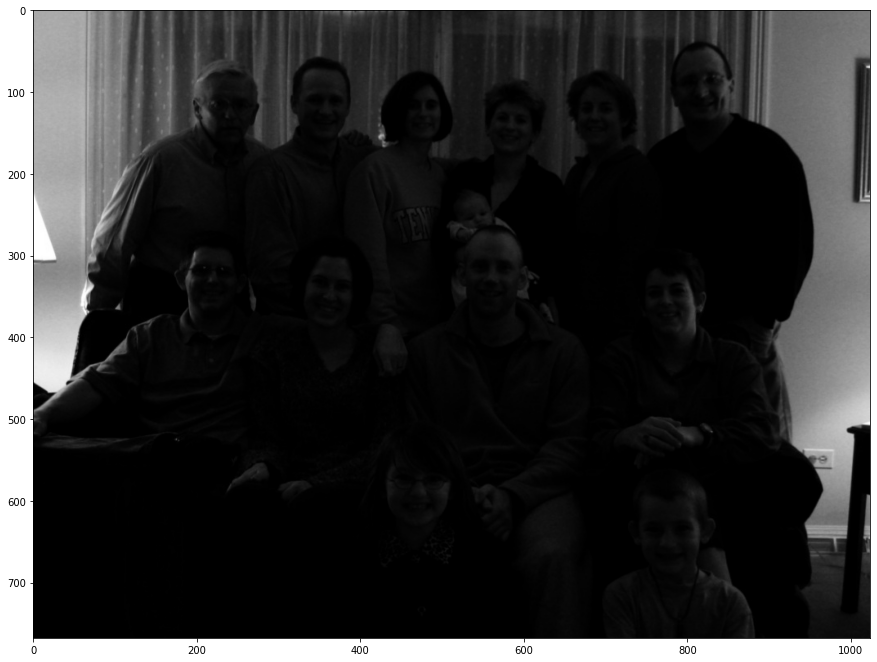

In [142]:
figure(figsize =(15,15))
imshow(im_fam)

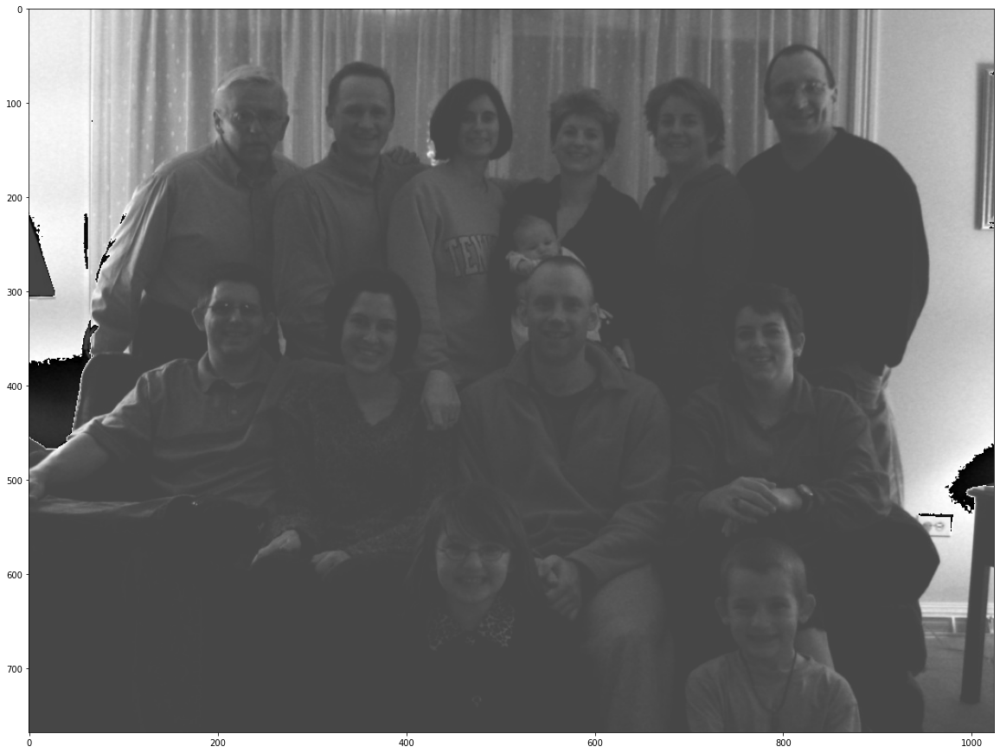

In [143]:
figure(figsize =(20,20))
imshow(im_fam +70)

b: No arquivo "fusca_placa":

    i - Melhore a imagem, de forma que seja possível ler a placa.

    ii -  Gere um novo arquivo somente com a área da placa original, e melhore a imagem desse arquivo.

In [145]:
im_fusca = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/fusca_placa.jpg")

In [146]:
type(im_fusca)

numpy.ndarray

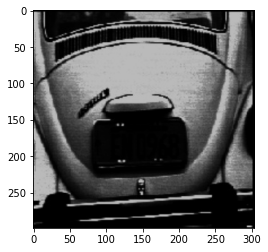

In [147]:
imshow(im_fusca)

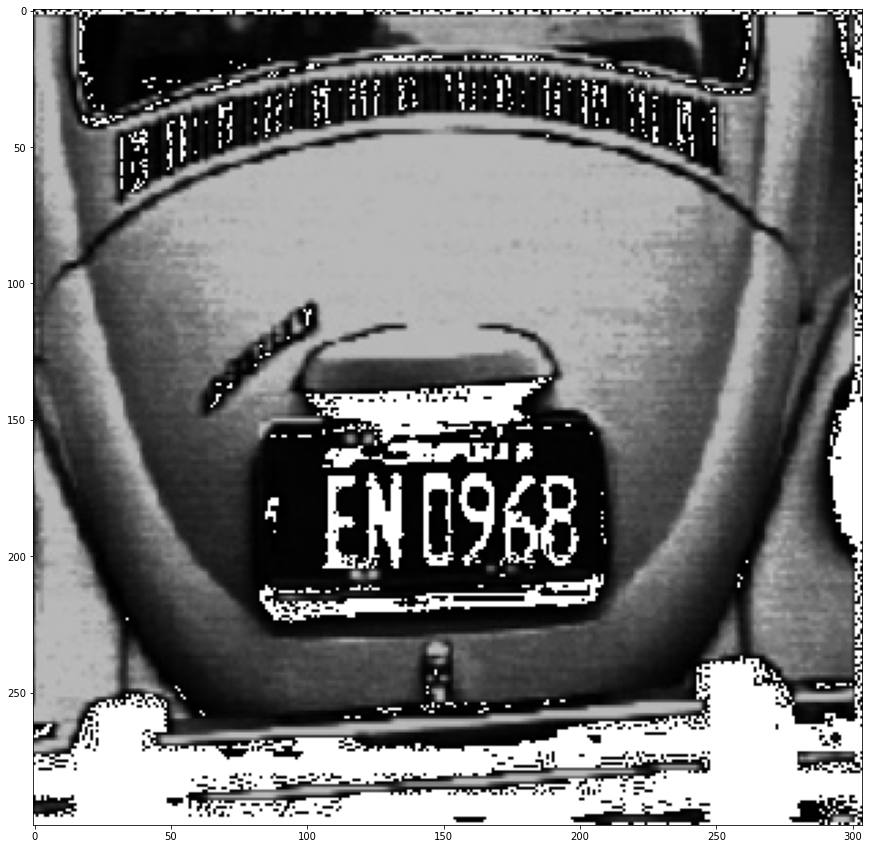

In [148]:
figure(figsize =(15,15))
#Clareamento da imagem
is_nova = imshow(im_fusca +255)

In [149]:
placa_ = im_fusca[150:250, 75:250]

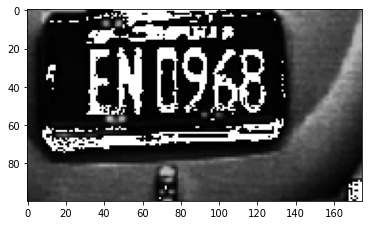

In [150]:
#ver somente a placa
imshow(placa_ +255)

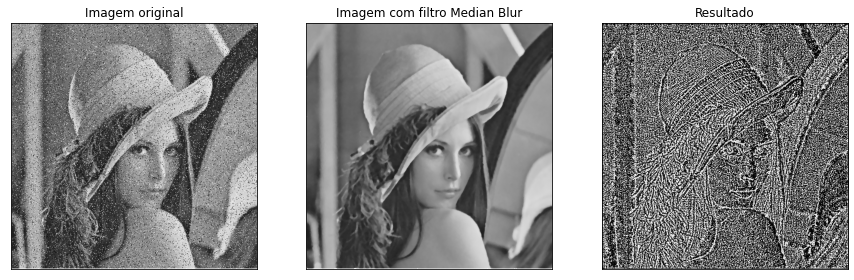

In [152]:
img_ruido = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/lena_saltpepper.png")
img_media = cv2.medianBlur(img_ruido, 5)
img_result = img_ruido - img_media

plot_imagens_3(img_ruido, "Imagem original", img_media,"Imagem com filtro Median Blur", img_result, "Resultado", (15,15))

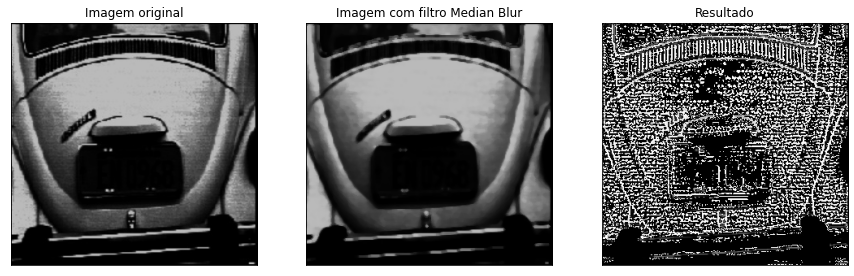

In [154]:
img_ruido1 = cv2.imread("/content/drive/MyDrive/3) Introdução a ML/imagens_am/fusca_placa.jpg")
img_media1 = cv2.medianBlur(img_ruido1, 5)
img_result1 = img_ruido1 - img_media1

plot_imagens_3(img_ruido1, "Imagem original", img_media1,"Imagem com filtro Median Blur", img_result1, "Resultado", (15,15))

In [156]:
#img = cv2.imread("D:/iam/")